# AI 221 Assignment 8: Non-Linear Dimensionality Reduction

<b>Description:</b> This notebook demonstrates classification on students' dropout and academic success, particularly demonstrating non-linear dimensionality reduction techniques (Kernel PCA, LLE, and UMAP). Dataset used is the Students' Dropout and Academic Success Dataset that can be found on https://archive.ics.uci.edu/dataset/697/predict+students+dropout+and+academic+success.
<br>
<br>
<b>Author:</b> Adrian Josele G. Quional
<br>
<b>Submitted to:</b> Dr. Jon Dewitt E. Dalisay
<br>
<b>Semester/Year:</b> 2nd Semester/2024-2025

In [1]:
# imports

# UCI repo
# Note: Before importing make sure to install first the UCI ML repo (if the dataset is not manually downloaded) using the command pip install ucimlrepo
from ucimlrepo import fetch_ucirepo 

# for plotting
import seaborn as sns
import matplotlib.pyplot as plt

# for dataset manipulation and computation
import pandas as pd
import numpy as np

# scikit-learn for data processing
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA, KernelPCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA

# scikit-learn for SVC
from sklearn.svm import SVC
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay

# scikit-learn for manifold learning
from sklearn.manifold import LocallyLinearEmbedding as LLE
import umap

# to suppress warnings in using UMAP
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.filterwarnings("ignore", message="gradient function is not yet implemented for hamming distance metric")

# for copying UMAP euclidean-transformed X
from copy import deepcopy

## Data fetching and preliminary data checks

In [2]:
# fetching the dataset 
student = fetch_ucirepo(id=697) # alternatively: fetch_ucirepo(name="Predict Students' Dropout and Academic Success")
student_df = student.data.original

# temporarily set the option to display all columns
with pd.option_context('display.max_columns', None):
    # checking the data
    print(student_df.head())

   Marital Status  Application mode  Application order  Course  \
0               1                17                  5     171   
1               1                15                  1    9254   
2               1                 1                  5    9070   
3               1                17                  2    9773   
4               2                39                  1    8014   

   Daytime/evening attendance  Previous qualification  \
0                           1                       1   
1                           1                       1   
2                           1                       1   
3                           1                       1   
4                           0                       1   

   Previous qualification (grade)  Nacionality  Mother's qualification  \
0                           122.0            1                      19   
1                           160.0            1                       1   
2                           122.0     

In [3]:
# checking info of the DataFrame
student_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 37 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Marital Status                                  4424 non-null   int64  
 1   Application mode                                4424 non-null   int64  
 2   Application order                               4424 non-null   int64  
 3   Course                                          4424 non-null   int64  
 4   Daytime/evening attendance                      4424 non-null   int64  
 5   Previous qualification                          4424 non-null   int64  
 6   Previous qualification (grade)                  4424 non-null   float64
 7   Nacionality                                     4424 non-null   int64  
 8   Mother's qualification                          4424 non-null   int64  
 9   Father's qualification                   

There are 36 features, all numerical. The target is either "Dropout" or "Graduate".

In [4]:
# checking descriptive statistics for each column
student_df.describe(include="all")

,Marital Status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Previous qualification (grade),Nacionality,Mother's qualification,Father's qualification,...,Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
count,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,...,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424.000000,4424
unique,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3
top,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Graduate
freq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2209
mean,1.178571,18.669078,1.727848,8856.642631,0.890823,4.577758,132.613314,1.873192,19.561935,22.275316,...,0.541817,6.232143,8.063291,4.435805,10.230206,0.150316,11.566139,1.228029,0.001969,NaN
std,0.605747,17.484682,1.313793,2063.566416,0.311897,10.216592,13.188332,6.914514,15.603186,15.343108,...,1.918546,2.195951,3.947951,3.014764,5.210808,0.753774,2.663850,1.382711,2.269935,NaN
min,1.000000,1.000000,0.000000,33.000000,0.000000,1.000000,95.000000,1.000000,1.000000,1.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7.600000,-0.800000,-4.060000,NaN
25%,1.000000,1.000000,1.000000,9085.000000,1.000000,1.000000,125.000000,1.000000,2.000000,3.000000,...,0.000000,5.000000,6.000000,2.000000,10.750000,0.000000,9.400000,0.300000,-1.700000,NaN
50%,1.000000,17.000000,1.000000,9238.000000,1.000000,1.000000,133.100000,1.000000,19.000000,19.000000,...,0.000000,6.000000,8.000000,5.000000,12.200000,0.000000,11.100000,1.400000,0.320000,NaN
75%,1.000000,39.000000,2.000000,9556.000000,1.000000,1.000000,140.000000,1.000000,37.000000,37.000000,...,0.000000,7.000000,10.000000,6.000000,13.333333,0.000000,13.900000,2.600000,1.790000,NaN


In [5]:
# checking missing values
print(f"Missing values in the DataFrame: \n{student_df.isnull().sum()}\n")

Missing values in the DataFrame: 
Marital Status                                    0
Application mode                                  0
Application order                                 0
Course                                            0
Daytime/evening attendance                        0
Previous qualification                            0
Previous qualification (grade)                    0
Nacionality                                       0
Mother's qualification                            0
Father's qualification                            0
Mother's occupation                               0
Father's occupation                               0
Admission grade                                   0
Displaced                                         0
Educational special needs                         0
Debtor                                            0
Tuition fees up to date                           0
Gender                                            0
Scholarship holder            

It is evident that there are no missing values (as also explicitly mentioned in the dataset website).

## EDA

In [6]:
# checking unique values of the target
print(f"Unique values of the target: {student_df["Target"].unique()}")
print(f"Count for each 'Target' unique values: {student_df["Target"].value_counts()}")

Unique values of the target: ['Dropout' 'Graduate' 'Enrolled']
Count for each 'Target' unique values: Target
Graduate    2209
Dropout     1421
Enrolled     794
Name: count, dtype: int64


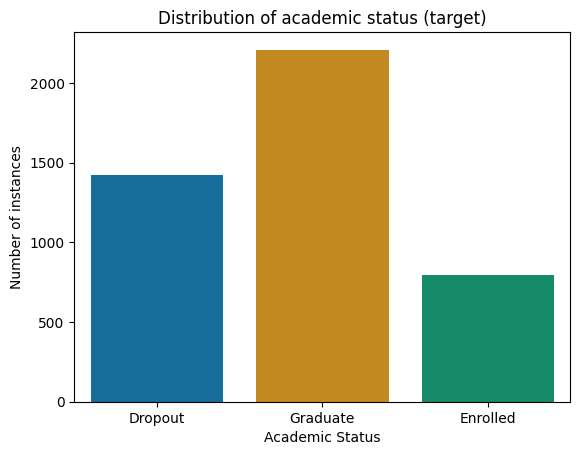

In [7]:
# plotting the distribution of the target
sns.countplot(data=student_df, x="Target", hue="Target", palette="colorblind")
plt.xlabel("Academic Status")
plt.ylabel("Number of instances")
plt.title("Distribution of academic status (target)")
plt.show()

There are much more graduates than dropout or enrolled in the dataset. Enrolled students are only 794, while graduates are 2209 and dropouts are 1421 in the dataset.

In [8]:
# manually separating feature columns into continuous, categorical, ordinal, and binary columns
# different transformations are to be done per type
# checking the variables table enabled the separation of these columns

continuous_cols = ["Previous qualification (grade)", "Admission grade", "Age at enrollment", "Curricular units 1st sem (credited)", 
                   "Curricular units 1st sem (enrolled)", "Curricular units 1st sem (evaluations)", "Curricular units 1st sem (approved)",
                   "Curricular units 1st sem (grade)", "Curricular units 1st sem (without evaluations)", "Curricular units 2nd sem (credited)", 
                   "Curricular units 2nd sem (enrolled)", "Curricular units 2nd sem (evaluations)", "Curricular units 2nd sem (approved)", 
                   "Curricular units 2nd sem (grade)", "Curricular units 2nd sem (without evaluations)", "Unemployment rate", "Inflation rate", "GDP"]

ordinal_cols = ["Application order", "Previous qualification", "Mother's qualification", "Father's qualification"]

categorical_cols = ["Marital Status", "Application mode", "Course", "Nacionality", "Mother's occupation", "Father's occupation"]

binary_cols = ["Daytime/evening attendance", "Displaced", "Educational special needs", "Debtor", "Tuition fees up to date", "Gender", "Scholarship holder", 
               "International"]

In [9]:
# creating separate DataFrames (with the Target) consisting of the different feature types
student_continuous_df = pd.concat([student_df[continuous_cols], student_df["Target"]], axis=1)
student_ordinal_df = pd.concat([student_df[ordinal_cols], student_df["Target"]], axis=1)
student_categorical_df = pd.concat([student_df[categorical_cols], student_df["Target"]], axis=1)
student_binary_df = pd.concat([student_df[binary_cols], student_df["Target"]], axis=1)

In [10]:
# checking the unique values of each ordinal column, and checking the count of each unique value of the column
# looping through all columns 
for col in list(student_ordinal_df.columns):
    print(f"'{col}' unique values: {student_ordinal_df[col].unique()}")
    print(f"Count for each '{col}' unique values: {student_ordinal_df[col].value_counts()}")
    print()

'Application order' unique values: [5 1 2 4 3 6 9 0]
Count for each 'Application order' unique values: Application order
1    3026
2     547
3     309
4     249
5     154
6     137
9       1
0       1
Name: count, dtype: int64

'Previous qualification' unique values: [ 1 19 42 39 10  3 40  2  4 12 43 15  6  9 38  5 14]
Count for each 'Previous qualification' unique values: Previous qualification
1     3717
39     219
19     162
3      126
12      45
40      40
42      36
2       23
6       16
9       11
4        8
38       7
43       6
10       4
15       2
5        1
14       1
Name: count, dtype: int64

'Mother's qualification' unique values: [19  1 37 38  3  4 42  2 34 12 40  9  5 39 11 41 30 14 35 36  6 10 29 43
 18 22 27 26 44]
Count for each 'Mother's qualification' unique values: Mother's qualification
1     1069
37    1009
19     953
38     562
3      438
34     130
2       83
4       49
12      42
5       21
40       9
9        8
39       8
41       6
42       4
6        4
43 

In [11]:
# checking the unique values of each categorical column, and checking the count of each unique value of the column
# looping through all columns 
for col in list(student_categorical_df.columns):
    print(f"'{col}' unique values: {student_categorical_df[col].unique()}")
    print(f"Count for each '{col}' unique values: {student_categorical_df[col].value_counts()}")
    print()

'Marital Status' unique values: [1 2 4 3 5 6]
Count for each 'Marital Status' unique values: Marital Status
1    3919
2     379
4      91
5      25
6       6
3       4
Name: count, dtype: int64

'Application mode' unique values: [17 15  1 39 18 53 44 51 43  7 42 16  5  2 10 57 26 27]
Count for each 'Application mode' unique values: Application mode
1     1708
17     872
39     785
43     312
44     213
7      139
18     124
42      77
51      59
16      38
53      35
15      30
5       16
10      10
2        3
57       1
26       1
27       1
Name: count, dtype: int64

'Course' unique values: [ 171 9254 9070 9773 8014 9991 9500 9238 9670 9853 9085 9130 9556 9147
 9003   33 9119]
Count for each 'Course' unique values: Course
9500    766
9147    380
9238    355
9085    337
9773    331
9670    268
9991    268
9254    252
9070    226
171     215
8014    215
9003    210
9853    192
9119    170
9130    141
9556     86
33       12
Name: count, dtype: int64

'Nacionality' unique values: [  1  

In [12]:
# checking the unique values of each binary column, and checking the count of each unique value of the column
# looping through all columns 
for col in list(student_binary_df.columns):
    print(f"'{col}' unique values: {student_binary_df[col].unique()}")
    print(f"Count for each '{col}' unique values: {student_binary_df[col].value_counts()}")
    print()

'Daytime/evening attendance' unique values: [1 0]
Count for each 'Daytime/evening attendance' unique values: Daytime/evening attendance
1    3941
0     483
Name: count, dtype: int64

'Displaced' unique values: [1 0]
Count for each 'Displaced' unique values: Displaced
1    2426
0    1998
Name: count, dtype: int64

'Educational special needs' unique values: [0 1]
Count for each 'Educational special needs' unique values: Educational special needs
0    4373
1      51
Name: count, dtype: int64

'Debtor' unique values: [0 1]
Count for each 'Debtor' unique values: Debtor
0    3921
1     503
Name: count, dtype: int64

'Tuition fees up to date' unique values: [1 0]
Count for each 'Tuition fees up to date' unique values: Tuition fees up to date
1    3896
0     528
Name: count, dtype: int64

'Gender' unique values: [1 0]
Count for each 'Gender' unique values: Gender
0    2868
1    1556
Name: count, dtype: int64

'Scholarship holder' unique values: [0 1]
Count for each 'Scholarship holder' unique 

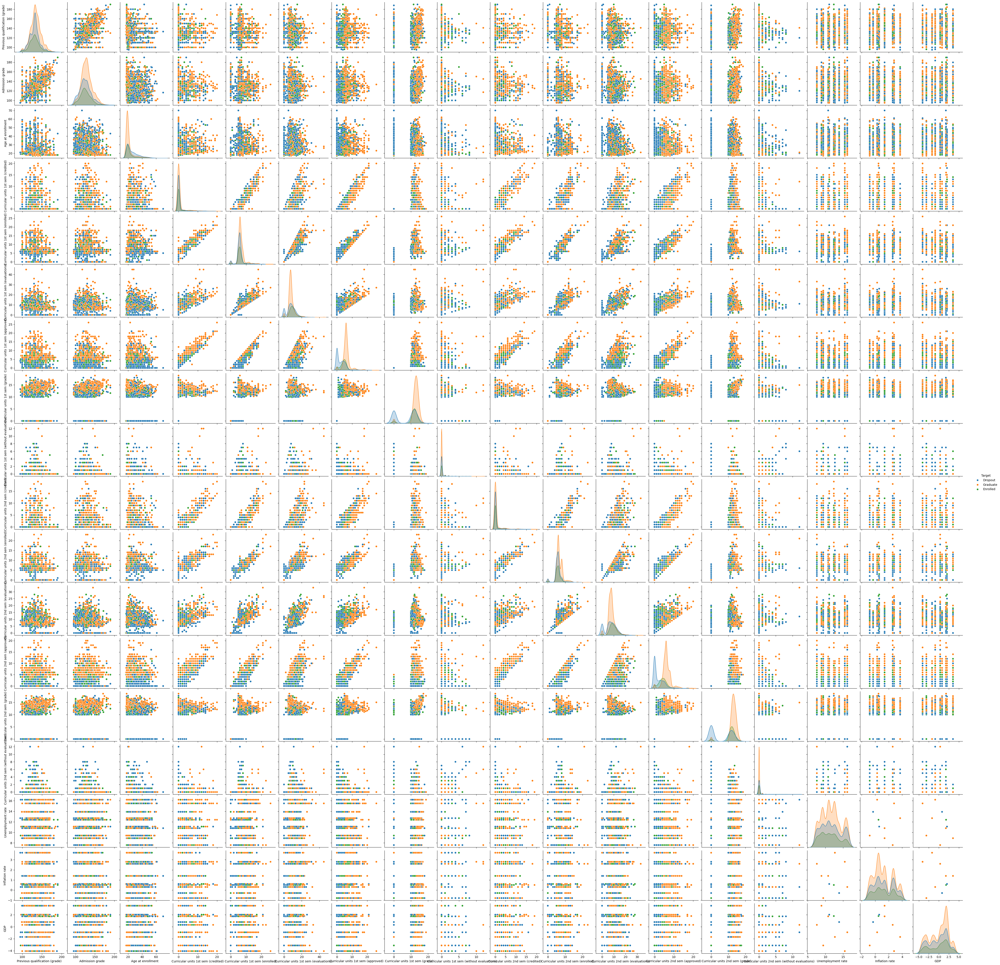

In [13]:
# creating a pairplot for all continuous features
sns.pairplot(data=student_continuous_df, hue="Target")
plt.show()

Based on the plot, there's no clear separation among the three student statuses across the continuous features. This calls for the use of dimensionality reduction techniques in hope of clearly separating the classes in the reduced subspace.

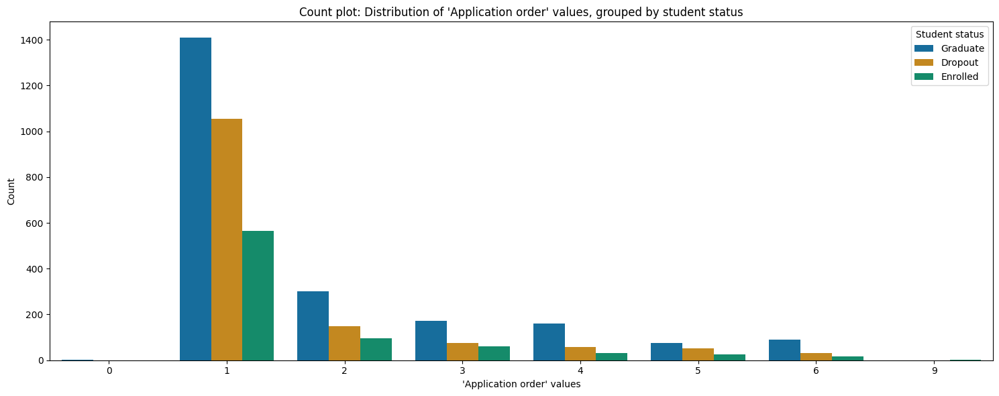

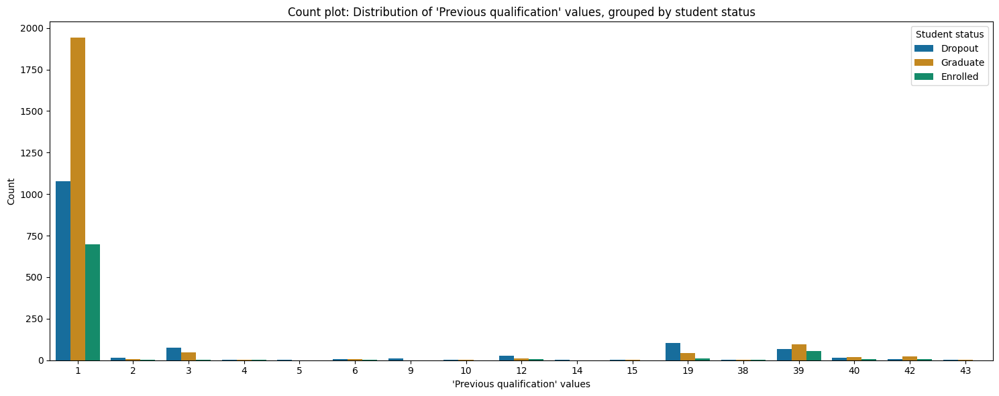

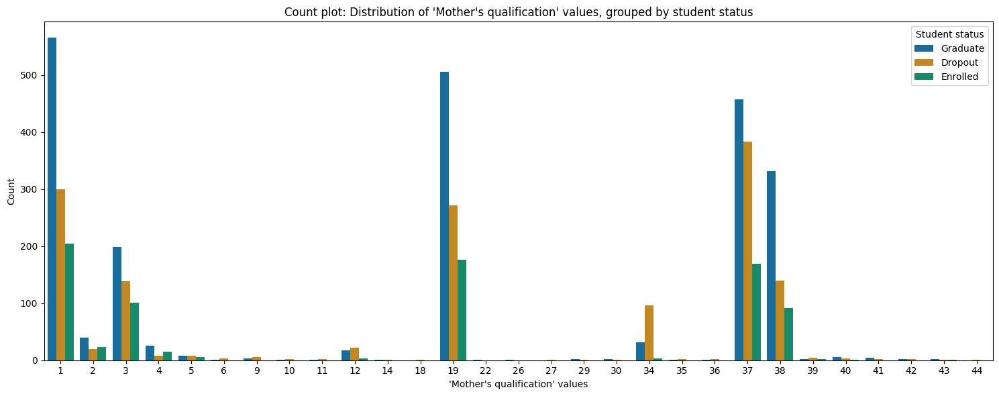

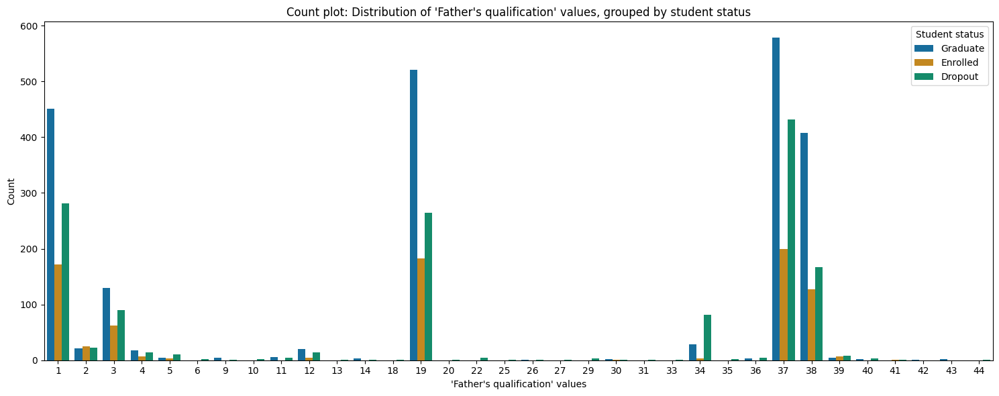

In [14]:
# looping through all ordinal columns except the Target column (last one)
for col in list(student_ordinal_df.columns[:-1]):
    plt.figure(figsize=(15, 6))

    # count plot distribution of the column values, grouped by target
    sns.countplot(data=student_ordinal_df, x=col, hue="Target", palette="colorblind")
    plt.xlabel(f"'{col}' values")
    plt.ylabel("Count")
    plt.title(f"Count plot: Distribution of '{col}' values, grouped by student status")
    plt.legend(title="Student status")
    
    plt.tight_layout()
    plt.show()

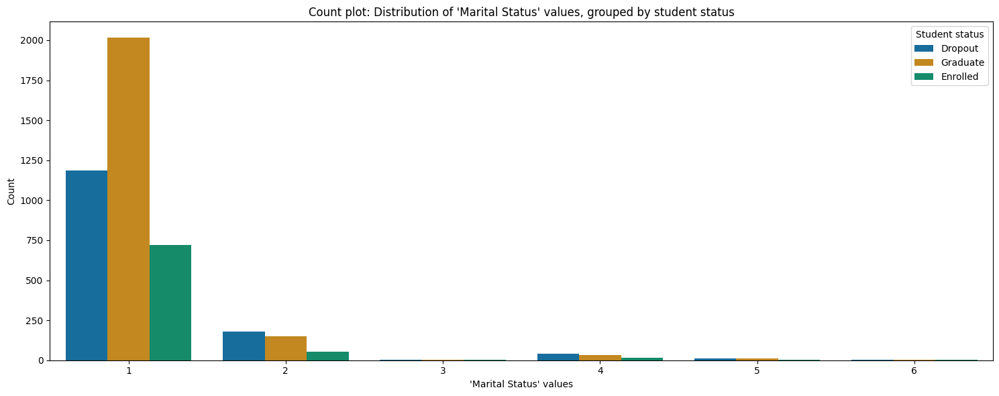

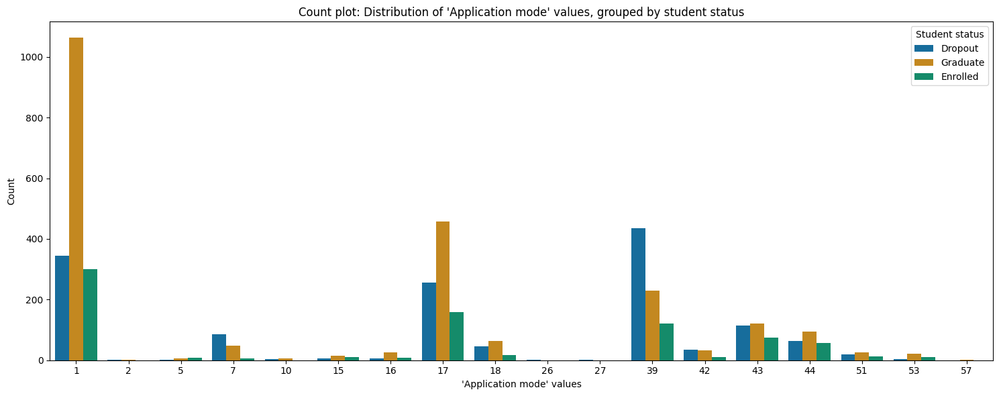

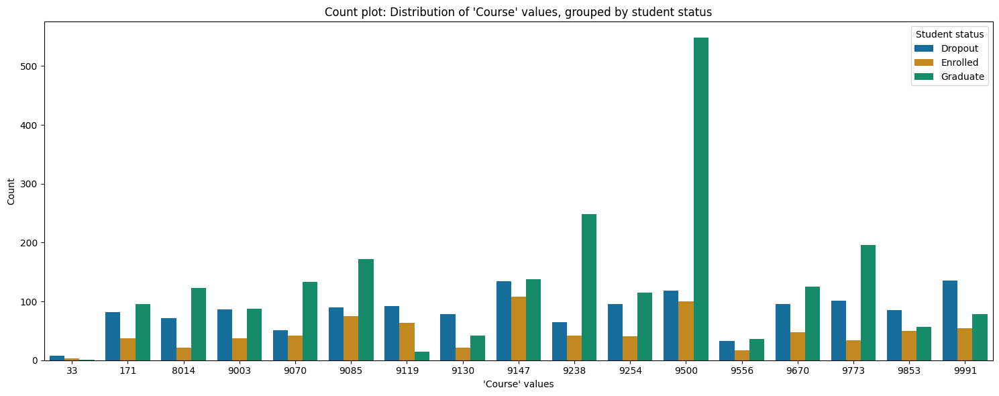

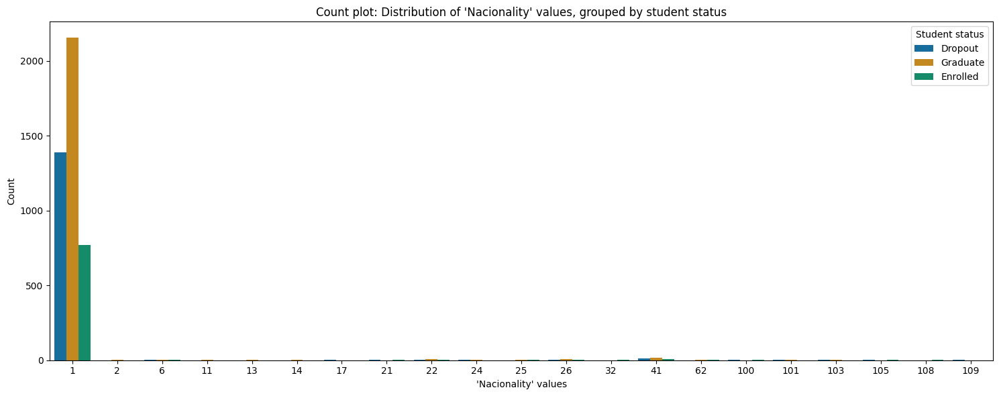

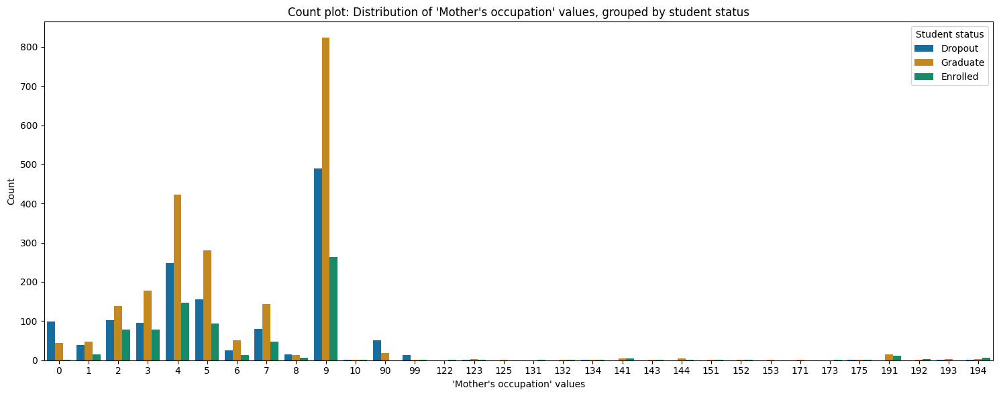

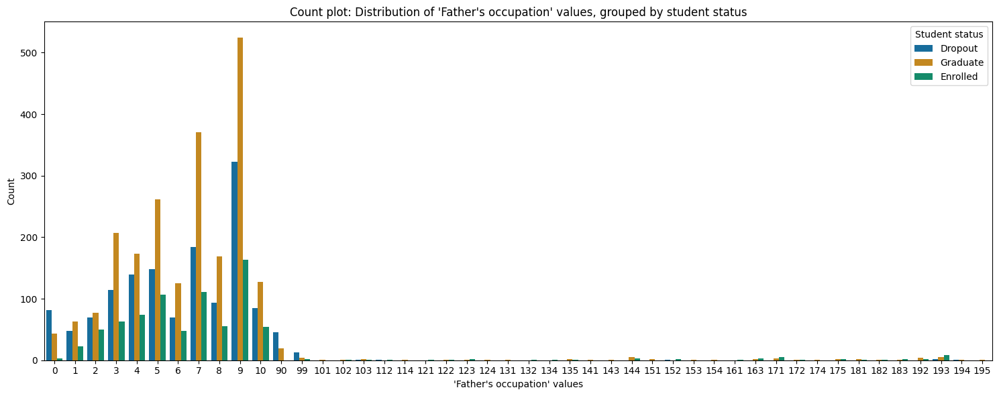

In [15]:
# looping through all categorical columns except the Target column (last one)
for col in list(student_categorical_df.columns[:-1]):
    plt.figure(figsize=(15, 6))

    # count plot distribution of the column values, grouped by target
    sns.countplot(data=student_categorical_df, x=col, hue="Target", palette="colorblind")
    plt.xlabel(f"'{col}' values")
    plt.ylabel("Count")
    plt.title(f"Count plot: Distribution of '{col}' values, grouped by student status")
    plt.legend(title="Student status")
    
    plt.tight_layout()
    plt.show()

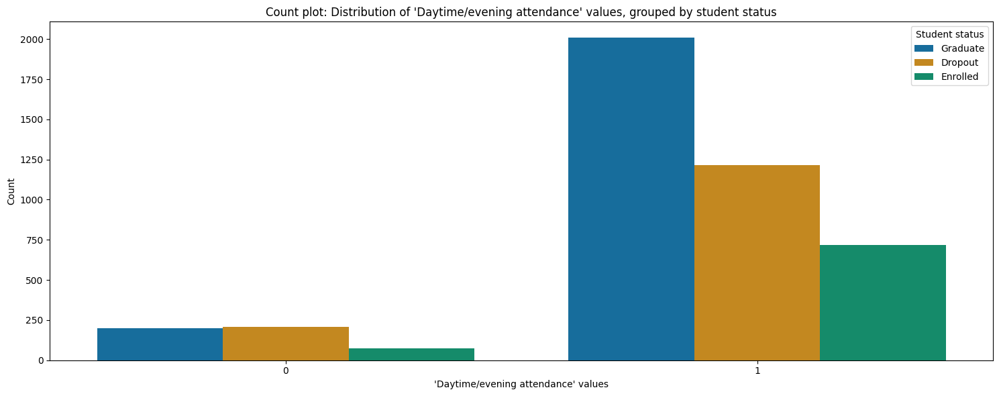

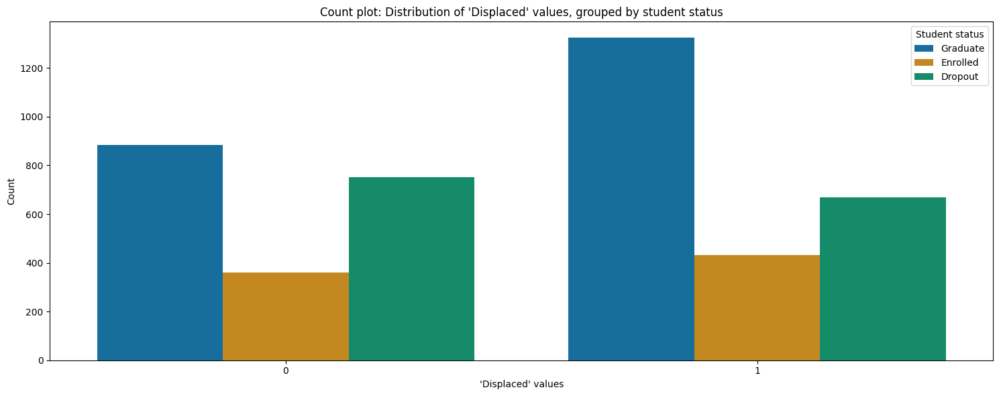

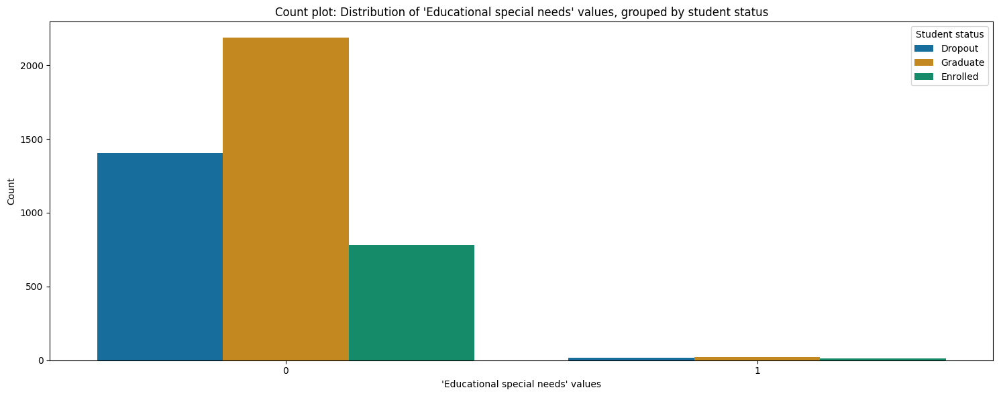

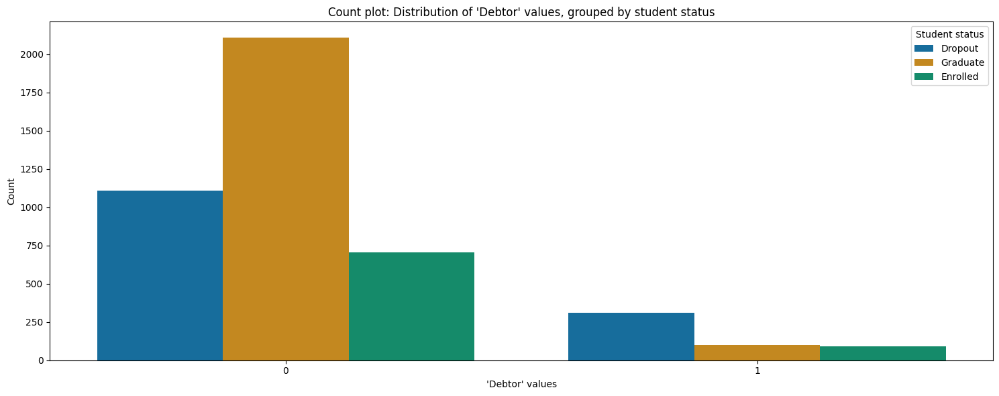

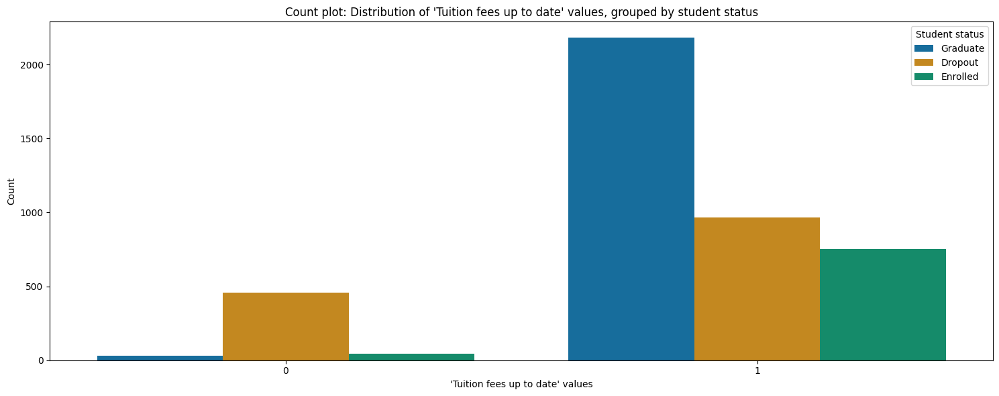

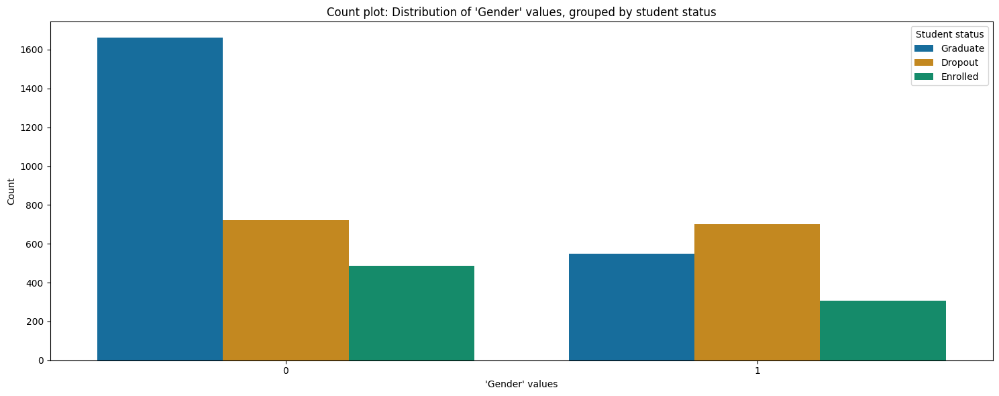

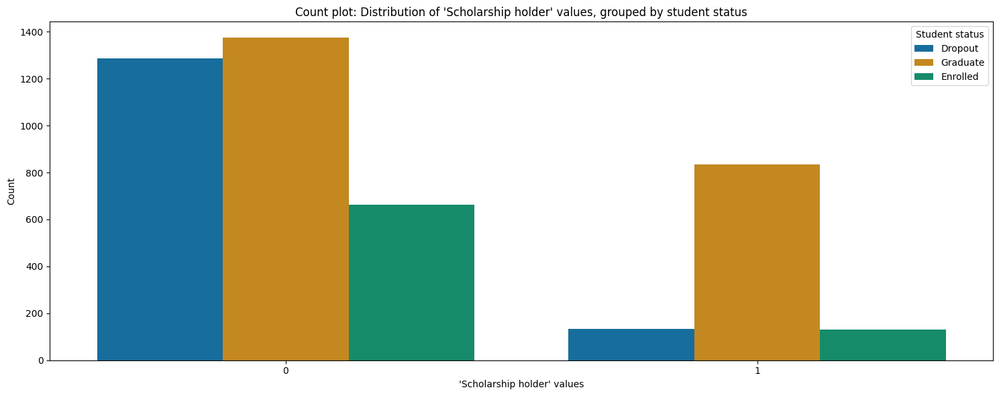

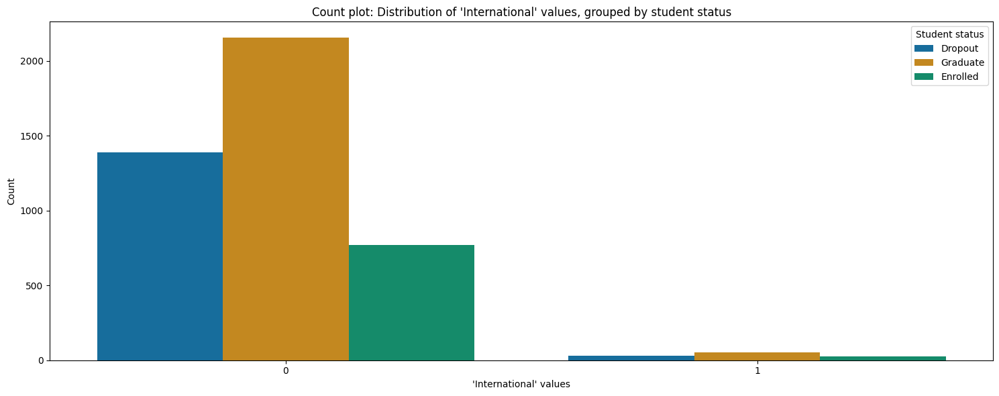

In [16]:
# looping through all binary columns except the Target column (last one)
for col in list(student_binary_df.columns[:-1]):
    plt.figure(figsize=(15, 6))

    # count plot distribution of the column values, grouped by target
    sns.countplot(data=student_binary_df, x=col, hue="Target", palette="colorblind")
    plt.xlabel(f"'{col}' values")
    plt.ylabel("Count")
    plt.title(f"Count plot: Distribution of '{col}' values, grouped by student status")
    plt.legend(title="Student status")
    
    plt.tight_layout()
    plt.show()

## Data Processing

In [17]:
# isolating the features and target
X_cont = student_continuous_df.drop("Target", axis=1).to_numpy()
X_ord = student_ordinal_df.drop("Target", axis=1).to_numpy()
X_cat = student_categorical_df.drop("Target", axis=1).to_numpy() 
X_bin = student_binary_df.drop("Target", axis=1).to_numpy()

y = student_continuous_df["Target"].to_numpy()

# checking the isolated features and target
print("X_cont:")
print(X_cont)
print("=====\n")

print("X_ord:")
print(X_ord)
print("=====\n")

print("X_cat:")
print(X_cat)
print("=====\n")

print("X_bin:")
print(X_bin)
print("=====\n")

print("y:")
print(y)

X_cont:
[[122.   127.3   20.   ...  10.8    1.4    1.74]
 [160.   142.5   19.   ...  13.9   -0.3    0.79]
 [122.   124.8   19.   ...  10.8    1.4    1.74]
 ...
 [154.   149.5   30.   ...  13.9   -0.3    0.79]
 [180.   153.8   20.   ...   9.4   -0.8   -3.12]
 [152.   152.    22.   ...  12.7    3.7   -1.7 ]]
=====

X_ord:
[[ 5  1 19 12]
 [ 1  1  1  3]
 [ 5  1 37 37]
 ...
 [ 1  1 37 37]
 [ 1  1 37 37]
 [ 1  1 38 37]]
=====

X_cat:
[[   1   17  171    1    5    9]
 [   1   15 9254    1    3    3]
 [   1    1 9070    1    9    9]
 ...
 [   1    1 9500    1    9    9]
 [   1    1 9147    1    7    4]
 [   1   10 9773   22    5    9]]
=====

X_bin:
[[1 1 0 ... 1 0 0]
 [1 1 0 ... 1 0 0]
 [1 1 0 ... 1 0 0]
 ...
 [1 1 0 ... 0 1 0]
 [1 1 0 ... 0 1 0]
 [1 1 0 ... 0 0 1]]
=====

y:
['Dropout' 'Graduate' 'Dropout' ... 'Dropout' 'Graduate' 'Graduate']


In [18]:
# defining transformers for preprocessing 
# standardization for continuous/ordinal, one-hot encoding for categorical
continuous_scaler = StandardScaler()  # standardizing continuous features
ordinal_scaler = StandardScaler()  # standardizing ordinal features
categorical_encoder = OneHotEncoder(handle_unknown='ignore') # one-hot encoding categories

X_cont_scaled = continuous_scaler.fit_transform(X_cont)
X_ord_scaled = ordinal_scaler.fit_transform(X_ord)
X_cat_encoded = categorical_encoder.fit_transform(X_cat).toarray()

# concatenating all features into one NumPy array
X_combined = np.hstack([X_cont_scaled, X_ord_scaled, X_cat_encoded, X_bin])

# checking the result of the transformations
print("Features array:")
print(X_combined)
print()
print("Target array:")
print(y) # it's ok not to label encode the targets since SVC can handle strings
print("=====\n")

# checking first row of features
print(f"First row of features (Length: {len(X_combined[0])}):")
print(X_combined[0])

Features array:
[[-0.80484126  0.02222877 -0.43036282 ...  1.          0.
   0.        ]
 [ 2.07681932  1.07192614 -0.56216796 ...  1.          0.
   0.        ]
 [-0.80484126 -0.15041883 -0.56216796 ...  1.          0.
   0.        ]
 ...
 [ 1.62182028  1.5553394   0.8876885  ...  0.          1.
   0.        ]
 [ 3.59348278  1.85229326 -0.43036282 ...  0.          1.
   0.        ]
 [ 1.47015393  1.727987   -0.16675256 ...  0.          0.
   1.        ]]

Target array:
['Dropout' 'Graduate' 'Dropout' ... 'Dropout' 'Graduate' 'Graduate']
=====

First row of features (Length: 170):
[-0.80484126  0.02222877 -0.43036282 -0.30081306 -2.52855964 -1.98606822
 -1.52125739 -2.19710239 -0.19927303 -0.28244231 -2.83833657 -2.04262989
 -1.47152688 -1.96348862 -0.19944099 -0.28763846  0.12438647  0.76576084
  2.49089589 -0.35023049 -0.03601818 -0.66977812  1.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.          1

In [19]:
# splitting into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X_combined, y, test_size=0.3, stratify=y, random_state=6)

# separating preprocessed continuous features from the other columns (for conduct of PCA, Kernel PCA, LDA, LLE, and UMAP later)
X_train_cont = X_train[:, :X_cont.shape[1]]  # selecting only continuous columns
X_test_cont = X_test[:, :X_cont.shape[1]]  # selecting only continuous columns
X_train_ord_cat_bin = X_train[:, X_cont.shape[1]:]  # remaining columns
X_test_ord_cat_bin = X_test[:, X_cont.shape[1]:]  # remaining columns

## Comparison of dimensionality reduction techniques (PCA, Kernel PCA, LDA, LLE, UMAP) + SVC

Evaluating PCA...
              precision    recall  f1-score   support

     Dropout       0.78      0.65      0.71       427
    Enrolled       0.33      0.53      0.41       238
    Graduate       0.79      0.71      0.75       663

    accuracy                           0.66      1328
   macro avg       0.64      0.63      0.62      1328
weighted avg       0.71      0.66      0.68      1328



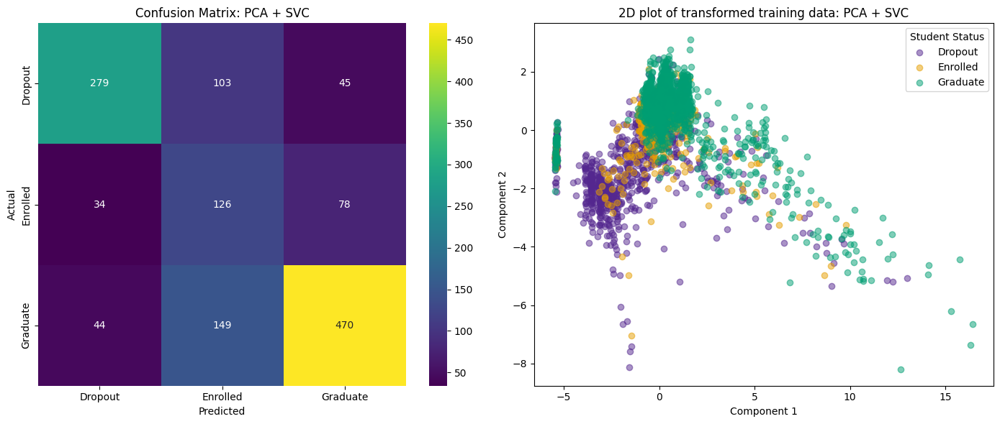

Evaluating KernelPCA...
              precision    recall  f1-score   support

     Dropout       0.73      0.67      0.70       427
    Enrolled       0.31      0.50      0.38       238
    Graduate       0.78      0.65      0.71       663

    accuracy                           0.63      1328
   macro avg       0.61      0.61      0.60      1328
weighted avg       0.68      0.63      0.65      1328



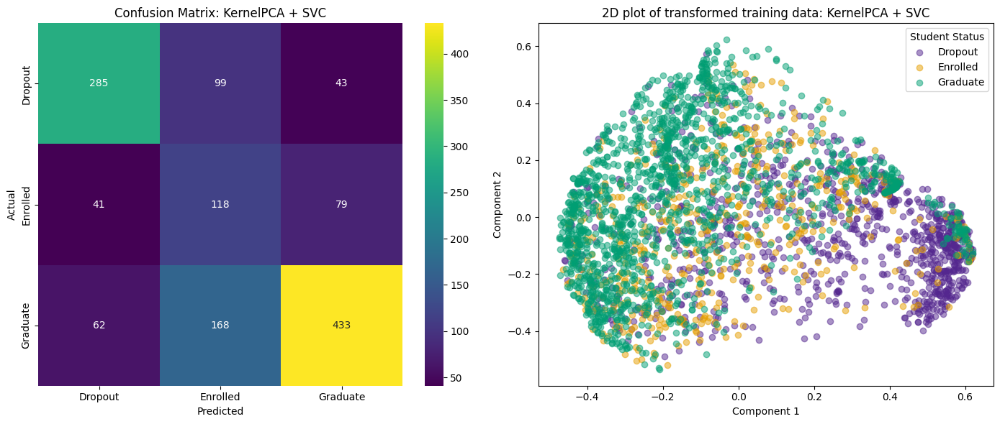

Evaluating LDA...
              precision    recall  f1-score   support

     Dropout       0.85      0.73      0.78       427
    Enrolled       0.44      0.59      0.50       238
    Graduate       0.85      0.82      0.83       663

    accuracy                           0.75      1328
   macro avg       0.71      0.71      0.71      1328
weighted avg       0.77      0.75      0.76      1328



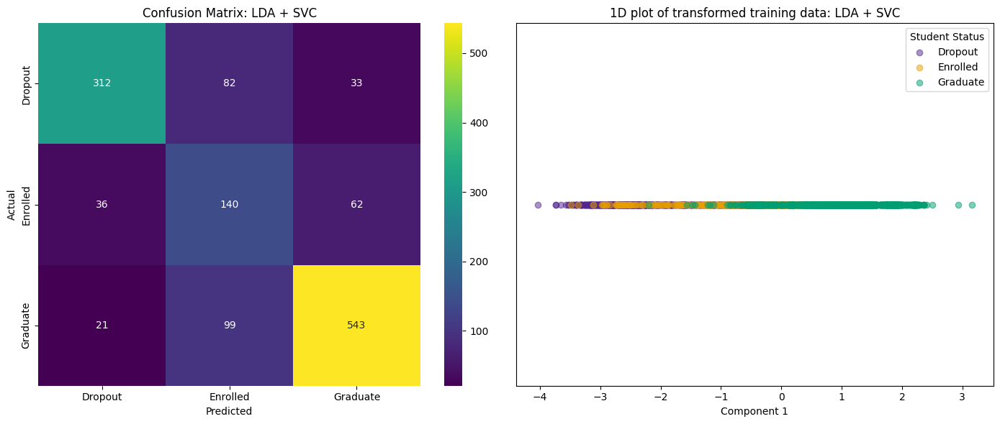

Evaluating LLE_Standard...
              precision    recall  f1-score   support

     Dropout       0.68      0.56      0.62       427
    Enrolled       0.28      0.49      0.36       238
    Graduate       0.72      0.61      0.66       663

    accuracy                           0.58      1328
   macro avg       0.56      0.56      0.55      1328
weighted avg       0.63      0.58      0.59      1328



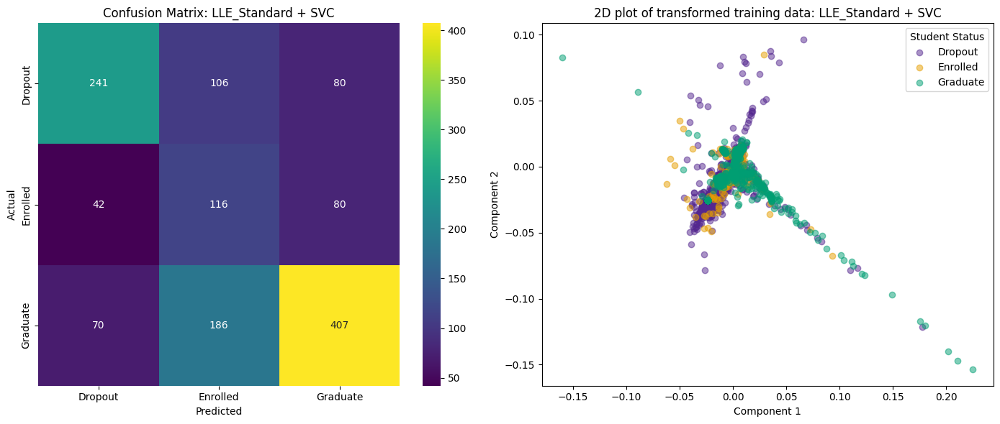

Evaluating LLE_Modified...
              precision    recall  f1-score   support

     Dropout       0.68      0.56      0.61       427
    Enrolled       0.29      0.49      0.36       238
    Graduate       0.72      0.61      0.66       663

    accuracy                           0.57      1328
   macro avg       0.56      0.56      0.55      1328
weighted avg       0.63      0.57      0.59      1328



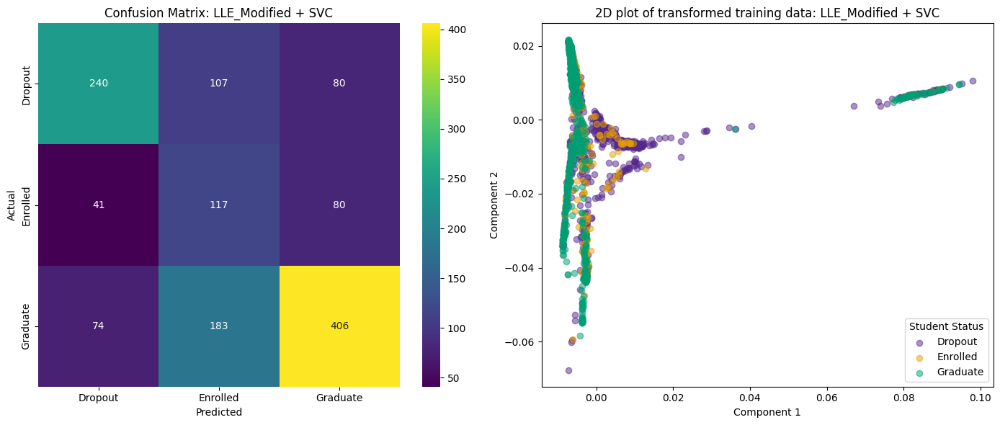

Evaluating UMAP_Euclidean...
              precision    recall  f1-score   support

     Dropout       0.80      0.58      0.67       427
    Enrolled       0.26      0.55      0.35       238
    Graduate       0.76      0.59      0.66       663

    accuracy                           0.58      1328
   macro avg       0.61      0.57      0.56      1328
weighted avg       0.68      0.58      0.61      1328



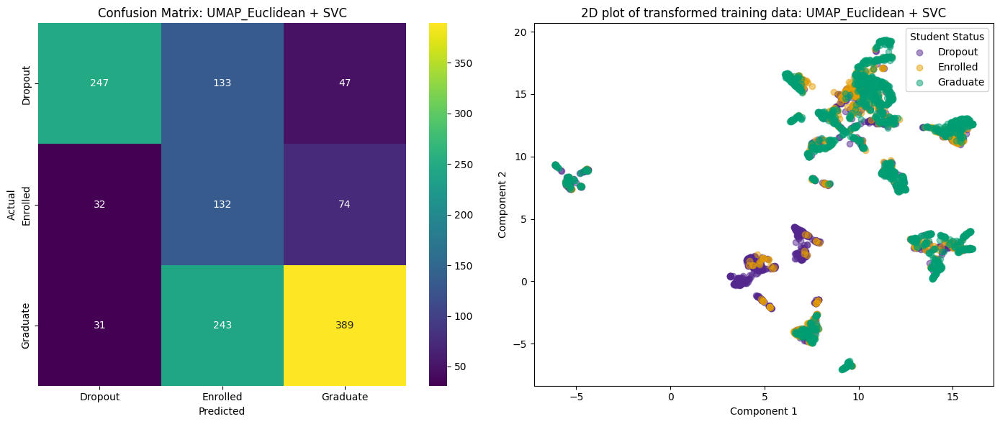

Evaluating UMAP_Euclidean + Hamming...
              precision    recall  f1-score   support

     Dropout       0.80      0.51      0.62       427
    Enrolled       0.20      0.37      0.26       238
    Graduate       0.64      0.60      0.62       663

    accuracy                           0.53      1328
   macro avg       0.55      0.49      0.50      1328
weighted avg       0.61      0.53      0.56      1328



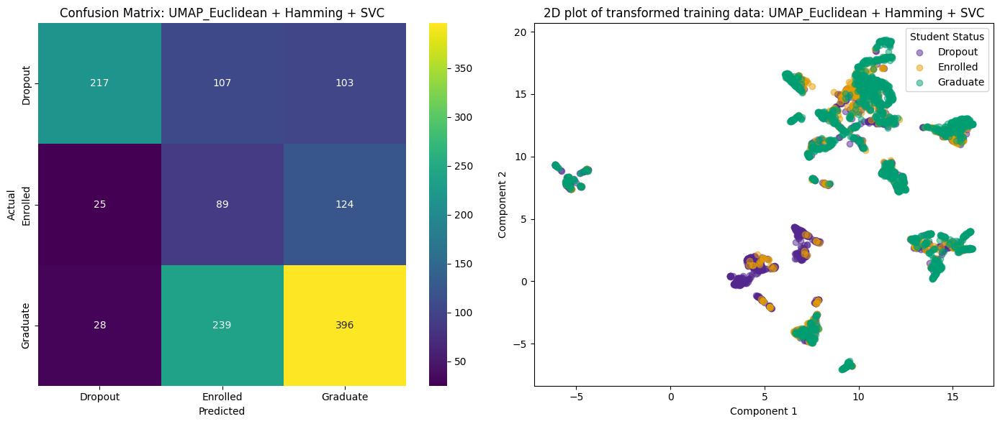

In [23]:
# defining dimensionality reduction methods
# setting all n_components to 2 for fair comparison and for visualization/explainability purposes
dim_reduction_methods = {
    'PCA': PCA(n_components=2),
    'KernelPCA': KernelPCA(n_components=2, kernel='rbf'),
    'LDA': LDA(n_components=1),
    'LLE_Standard': LLE(n_components=2, n_neighbors=15, method='standard'),
    'LLE_Modified': LLE(n_components=2, n_neighbors=15, method='modified'),
    'UMAP_Euclidean': umap.UMAP(n_components=2, n_neighbors=15, metric='euclidean'),
    'UMAP_Euclidean + Hamming': umap.UMAP(n_components=2, n_neighbors=15, metric='hamming')
}

# defining a colorblind-friendly palette for 2D visualization
color_palette = {"Dropout": "#54278f", "Enrolled": "#E69F00", "Graduate": "#009E73"}  # deep purple, orange, and green

# training and evaluating SVC for each dimensionality reduction method
for name, dim_reduction_method in dim_reduction_methods.items():
    print(f"Evaluating {name}...")
    
    if name == 'LDA':
        X_train_reduced = dim_reduction_method.fit_transform(X_train_cont, y_train)
        X_test_reduced = dim_reduction_method.transform(X_test_cont)
    
    elif name == 'UMAP_Euclidean':
        X_train_reduced_euclidean = dim_reduction_method.fit_transform(X_train_cont)
        X_test_reduced_euclidean = dim_reduction_method.transform(X_test_cont)
        X_train_reduced = deepcopy(X_train_reduced_euclidean)
        X_test_reduced = deepcopy(X_test_reduced_euclidean)
    
    # double UMAP
    elif name == 'UMAP_Euclidean + Hamming':
        X_train_reduced_hamming = dim_reduction_method.fit_transform(X_train_ord_cat_bin)
        X_test_reduced_hamming = dim_reduction_method.transform(X_test_ord_cat_bin)
        X_train_reduced = np.hstack((X_train_reduced_euclidean, X_train_reduced_hamming)) # concatenating the reduction obtained from UMAP Euclidean
        X_test_reduced = np.hstack((X_test_reduced_euclidean, X_test_reduced_hamming)) # concatenating the reduction obtained from UMAP Euclidean
    
    # for PCA, KernelPCA, LLE Standard, and LLE Modified
    else: 
        X_train_reduced = dim_reduction_method.fit_transform(X_train_cont)
        X_test_reduced = dim_reduction_method.transform(X_test_cont)

    if name == 'UMAP_Euclidean + Hamming':
        X_train_final = deepcopy(X_train_reduced)
        X_test_final = deepcopy(X_test_reduced)

    else:
        # concatenating reduced continuous features with original categorical features
        X_train_final = np.hstack([X_train_reduced, X_train_ord_cat_bin]) # final training data
        X_test_final = np.hstack([X_test_reduced, X_test_ord_cat_bin]) # final test data
    
    # for reproducibility of results
    # setting random seed before fitting
    np.random.seed(6)
    
    # training a simple SVC using the transformed features
    # no hyperparater search since the main goal is just to compare the different dimensionality reduction techniques
    clf = SVC(kernel='rbf', class_weight='balanced')
    clf.fit(X_train_final, y_train)
    y_pred = clf.predict(X_test_final)
    
    # for labelling the 2D plot
    class_names = ['Dropout', 'Enrolled', 'Graduate']

    # classification report
    print(classification_report(y_test, y_pred, target_names=class_names))
    
    # displaying confusion matrix side-by-side with a 2D scatter plot
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    
    # confusion matrix
    cm = confusion_matrix(y_test, y_pred, labels=class_names)
    sns.heatmap(cm, annot=True, fmt='d', cmap='viridis', xticklabels=class_names, yticklabels=class_names, ax=axes[0])
    axes[0].set_xlabel('Predicted')
    axes[0].set_ylabel('Actual')
    axes[0].set_title(f'Confusion Matrix: {name} + SVC')
    
    # scatter plot of transformed training data with labels
    if 'LDA' in name:
        # 1D scatter plot for LDA
        for label in class_names:
            mask = y_train == label
            axes[1].scatter(X_train_reduced[mask], np.zeros_like(X_train_reduced[mask]), label=label, c=color_palette[label], alpha=0.5)
        
        axes[1].legend(title="Student Status")
        axes[1].set_title(f'1D plot of transformed training data: {name} + SVC')
        axes[1].set_xlabel('Component 1')
        axes[1].set_yticks([])
    
    else:
        # 2D scatter plot for other methods
        for label in class_names:
            mask = y_train == label
            axes[1].scatter(X_train_reduced[mask, 0], X_train_reduced[mask, 1], label=label, c=color_palette[label], alpha=0.5)
        
        axes[1].legend(title="Student Status")
        axes[1].set_title(f'2D plot of transformed training data: {name} + SVC')
        axes[1].set_xlabel('Component 1')
        axes[1].set_ylabel('Component 2')
    
    plt.tight_layout()
    plt.show()

Using dimensionality reduction methods (linear and non-linear) coupled with SVC for classifying student status (Dropout, Enrolled, and Graduate), the following are the results, looking at test accuracies alone:

* PCA: 0.66
* Kernel PCA: 0.63
* LDA: 0.75
* LLE Standard: 0.58
* LLE Modified: 0.57
* UMAP Euclidean: 0.58
* UMAP Euclidean + Hamming: 0.53

Looking at the results, they are not stellar. The highest test accuracy achieved is 75% from LDA + SVC, and in general, linear dimensionality reduction techniques (coupled with SVC) outperformed the non-linear dimensionality reduction techniques, which is surprising. However, this is not to say that the former is always better than the letter. Note that the experiments conducted did not include methods to balance the data and no hyperparameter search is done, so if these are employed, non-linear dimensionality reduction techniques coupled with SVC might have a chance to produce better results. Also, no extensive feature selection is done which can affect the results. Moreover, looking at the 2D plots, it seems that the "Enrolled" students have a lot of overlap with "Graduate" and "Dropout" which made it difficult for the models to separate the three classes.

Despite the unremarkable results, perhaps the biggest takeaway from the experiments is that, different dimensionality reduction techniques transforms and "visualizes" the data differently, as seen through the 2D plots. In particular, for LLE, it seems that it is "finding" some linearity among features while for UMAP, the technique attempts to really further separate the labels. 

For further explorations, it is envisioned that additional experiments be conducted on the properties of non-linear dimensionality reduction techniques. For example, there are many variants of LLE which wasn't explored in the experiments. Also, there are other hyperparameters that weren't tuned, such as the number of components for each dimensionality reduction technique.

## Summary

* Student status classification was conducted to primarily demonstrate the effect of non-linear dimensionality reduction techniques.
* From the experiments however, it showed that, in general, linear dimensionality reduction techniques outperformed non-linear dimensionality reduction techniques for this particular exercise; however, it does not mean that they would always perform better. Further experiments are envisioned to be conducted in order to fully explore the properties of non-linear dimensionality reduction techniques.